In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

In [70]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import VotingClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

In [4]:
df = pd.read_csv('Churn_Prediction.csv')

# Question 1

### Statistical Description

In [5]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
df.shape

(7043, 21)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [8]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

### Special Treatment

In [9]:
# check for missing values
missing_val = df.isnull().sum().sort_values(ascending=False)

# percentage of missing values in entire dataset
missing_val = pd.DataFrame(data = missing_val, columns = ["Count"])
missing_val["Percentage"] = missing_val["Count"].apply(lambda x: "{:.3f}".format(float(x)/df.shape[0]*100))
missing_val

,Count,Percentage
customerID,0,0.000
DeviceProtection,0,0.000
TotalCharges,0,0.000
MonthlyCharges,0,0.000
PaymentMethod,0,0.000
PaperlessBilling,0,0.000
Contract,0,0.000
StreamingMovies,0,0.000
StreamingTV,0,0.000
TechSupport,0,0.000


In [11]:
# I do not need customer id's for classification. Hence, I am dropping it.
df = df.drop(['customerID'], axis = 1)
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [12]:
df['TotalCharges'] = pd.to_numeric(df.TotalCharges, errors='coerce')
df.isnull().sum()

gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [13]:
# now I see that the TotalCharges has 11 missing values
df.drop(labels=df[df['tenure'] == 0].index, axis=0, inplace=True)
df[df['tenure'] == 0].index

df.fillna(df["TotalCharges"].mean())

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


In [22]:
df["SeniorCitizen"]= df["SeniorCitizen"].map({0: "No", 1: "Yes"})
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,NaN,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,NaN,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,NaN,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,NaN,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,NaN,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [179]:
df = df.drop(['SeniorCitizen'], axis = 1)

In [15]:
numerical_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
df[numerical_cols].describe()

,tenure,MonthlyCharges,TotalCharges
count,7032.000000,7032.000000,7032.000000
mean,32.421786,64.798208,2283.300441
std,24.545260,30.085974,2266.771362
min,1.000000,18.250000,18.800000
25%,9.000000,35.587500,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.862500,3794.737500
max,72.000000,118.750000,8684.800000


### Visualizations

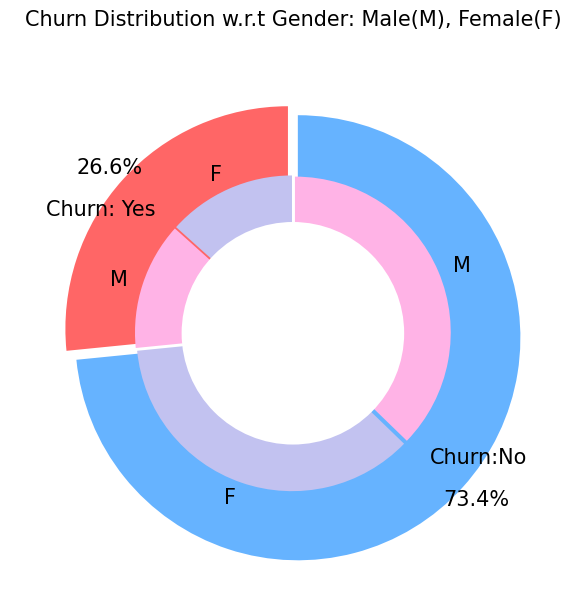

In [16]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes","Churn:No"]
values = [1869,5163]
labels_gender = ["F","M","F","M"]
sizes_gender = [939,930 , 2544,2619]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3) 
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}

#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%',pctdistance=1.08, labeldistance=0.8,colors=colors, startangle=90,frame=True, explode=explode,radius=10, textprops =textprops, counterclock = True, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )

#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

# show plot 
plt.axis('equal')
plt.tight_layout()
plt.show()

In [17]:
fig = px.histogram(df, x="Churn", color="PaymentMethod", title="<b>Customer Payment Method distribution w.r.t. Churn</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

# Question 2

### Computing the PCC

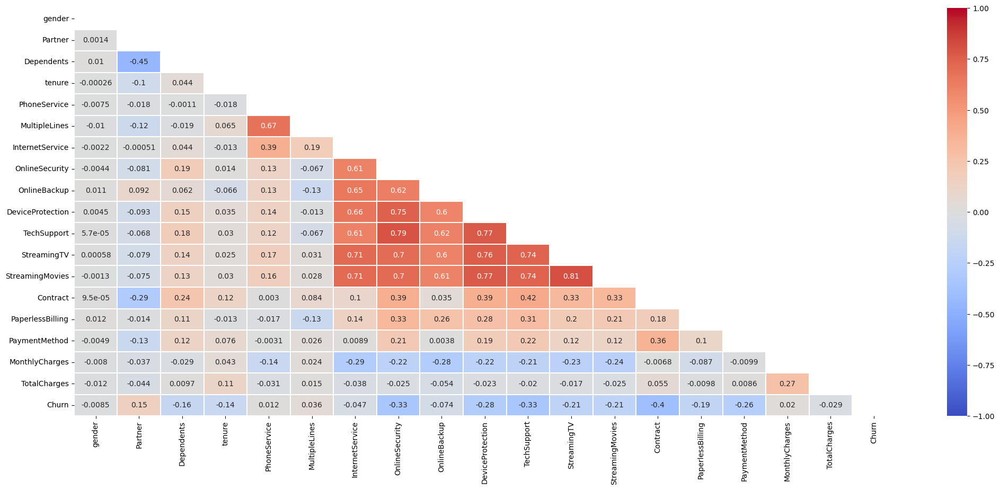

In [180]:
plt.figure(figsize=(25, 10))
corr = df.apply(lambda x: pd.factorize(x)[0]).corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

### PCC Scatter Plot

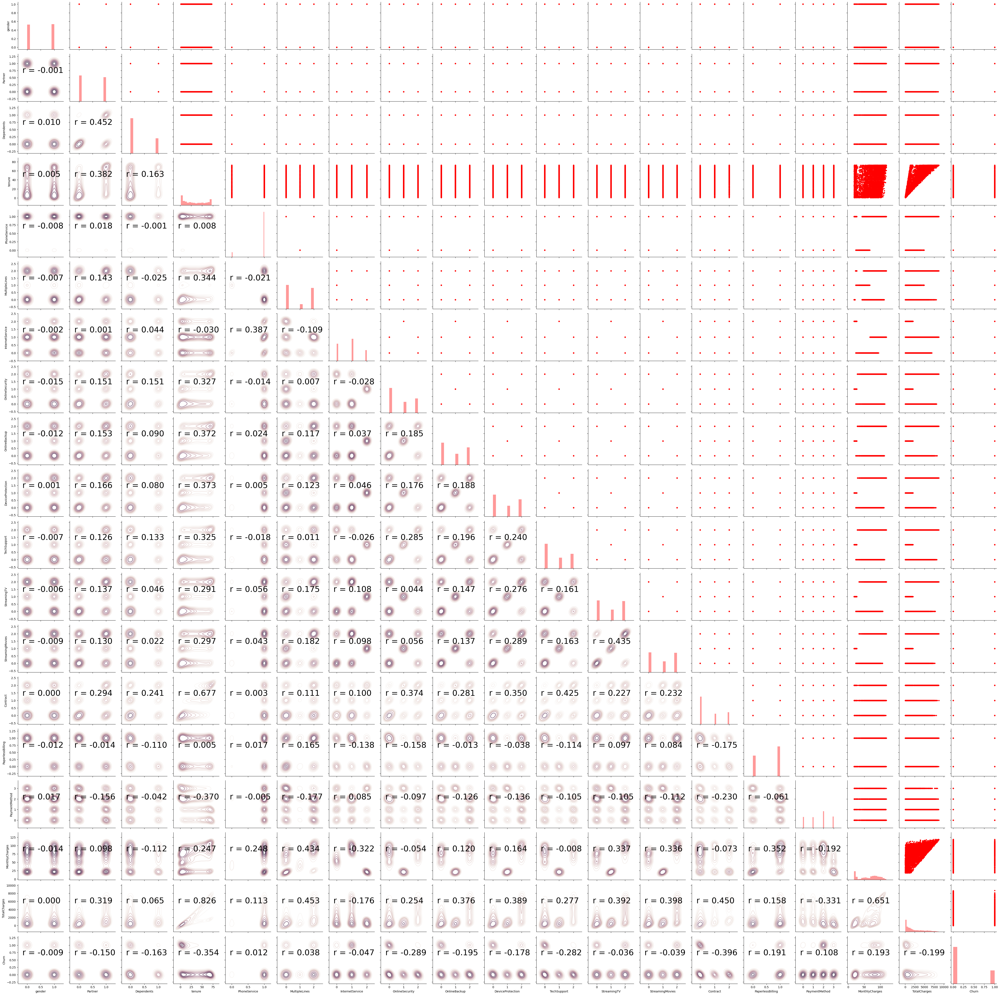

In [182]:
from scipy import stats

# scatter plot for PCC
def PCCfunc(x, y, **kwargs):
    r, _ = stats.pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.3f}".format(r), xy=(.1, .6), xycoords=ax.transAxes, size=27)
    
color_map = sns.cubehelix_palette(light=1, dark=0.1, hue=0.5, as_cmap=True)

sns.set_context(font_scale=4)

# pair grid 
pg = sns.PairGrid(df)

# scatter plot on upper
pg.map_upper(plt.scatter, s=10, color="red")

# distribution plot on diagonal
pg.map_diag(sns.distplot, kde=False, color="red")

# density plot and correlation coefficient on lower
pg.map_lower(sns.kdeplot, cmap=color_map)
pg.map_lower(PCCfunc)

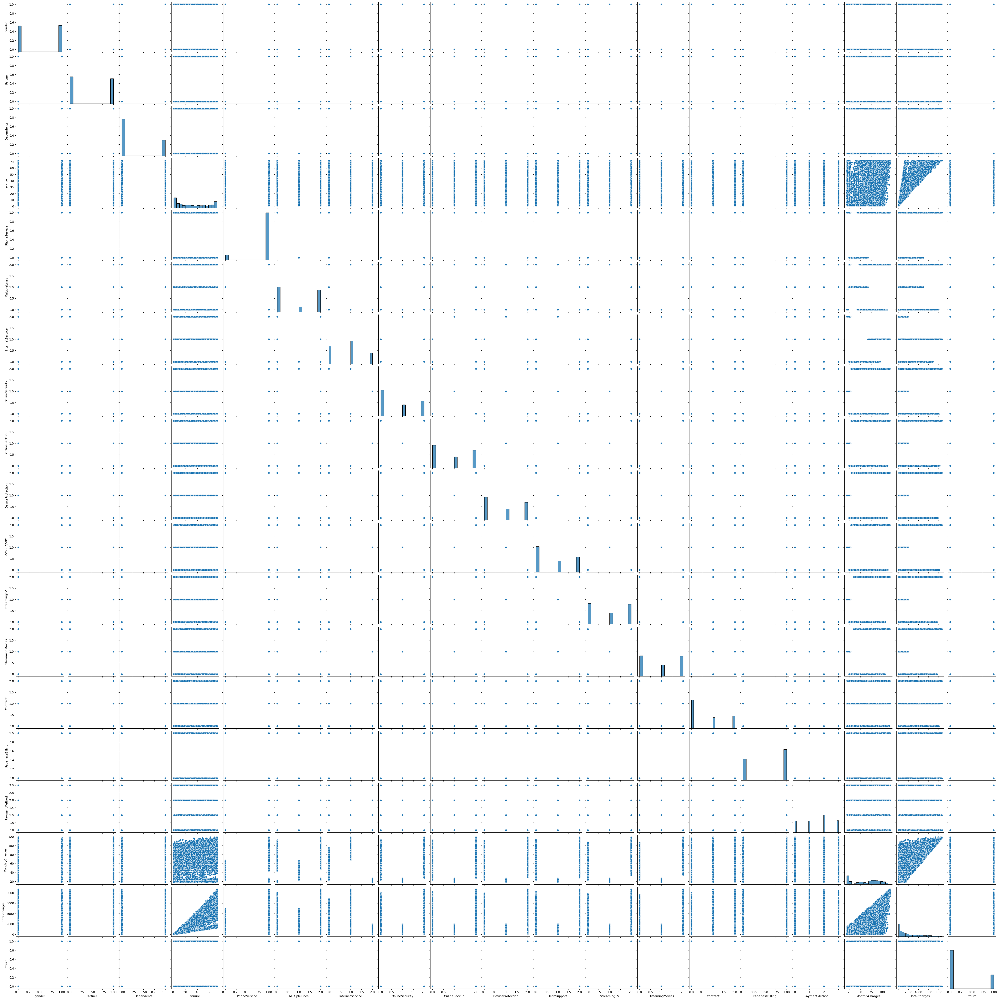

In [181]:
sns.pairplot(df)

In [27]:
def object_to_int(dataframe_series):
    if dataframe_series.dtype=='object':
        dataframe_series = LabelEncoder().fit_transform(dataframe_series)
    return dataframe_series

In [30]:
df = df.apply(lambda x: object_to_int(x))
df.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,0,1,0,1,0,1,0,0,2,0,0,0,0,0,1,2,29.85,29.85,0
1,1,0,0,0,34,1,0,0,2,0,2,0,0,0,1,0,3,56.95,1889.50,0
2,1,0,0,0,2,1,0,0,2,2,0,0,0,0,0,1,3,53.85,108.15,1
3,1,0,0,0,45,0,1,0,2,0,2,2,0,0,1,0,0,42.30,1840.75,0
4,0,0,0,0,2,1,0,1,0,0,0,0,0,0,0,1,2,70.70,151.65,1


In [95]:
df.corr()['Churn'].sort_values(ascending = False)

Churn               1.000000
MonthlyCharges      0.192858
PaperlessBilling    0.191454
PaymentMethod       0.107852
MultipleLines       0.038043
PhoneService        0.011691
gender             -0.008545
StreamingTV        -0.036303
StreamingMovies    -0.038802
InternetService    -0.047097
Partner            -0.149982
Dependents         -0.163128
DeviceProtection   -0.177883
OnlineBackup       -0.195290
TotalCharges       -0.199484
TechSupport        -0.282232
OnlineSecurity     -0.289050
tenure             -0.354049
Contract           -0.396150
SeniorCitizen            NaN
Name: Churn, dtype: float64

# Question 3

### Splitting the data into train (60%), validation (20%) and test (20%) set

In [32]:
X = df.drop(columns = ['Churn'])
y = df['Churn'].values

In [33]:
X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.2, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.25, stratify=y_trainval)

### Verification of Splitting

In [35]:
def distplot(feature, frame, color='r'):
    plt.figure(figsize=(8,3))
    plt.title("Distribution for {}".format(feature))
    ax = sns.distplot(frame[feature], color= color)

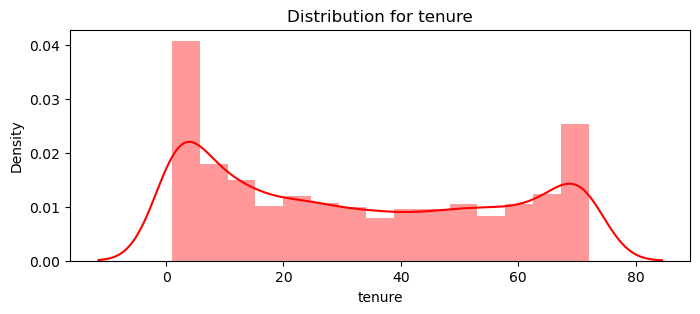

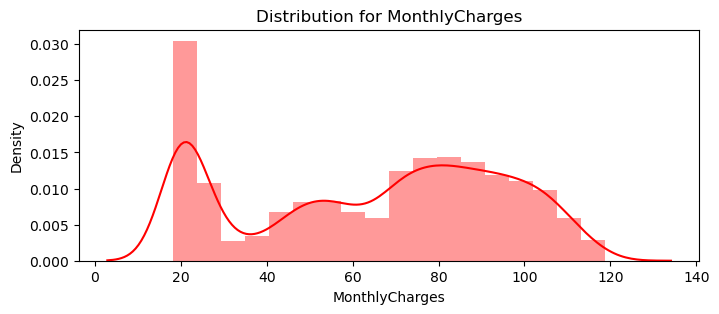

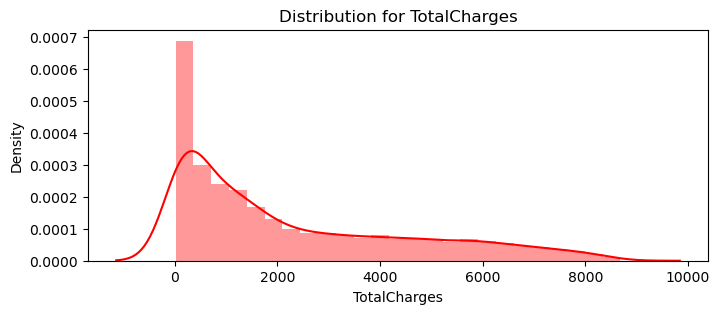

In [36]:
num_cols = ["tenure", 'MonthlyCharges', 'TotalCharges']
for feat in num_cols: distplot(feat, df)

Since the numerical features are distributed over different value ranges, I will use standard scalar to scale them down to the same range.

In [41]:
scaler= StandardScaler()

X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_val[num_cols] = scaler.fit_transform(X_val[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

In [133]:
import numpy as np

# Calculate variances
train_variance = np.var([X_train])
val_variance = np.var([X_val])
test_variance = np.var([X_test])

print("Training set variance:", train_variance)
print("Validation set variance:", val_variance)
print("Test set variance:", test_variance)

Training set variance: 0.8014718298667889
Validation set variance: 0.8036244789464614
Test set variance: 0.7953268553964489


Since, the variance is almost the same across the training, validation and test sets, I can infer that the data is almost equally distributed. Moreover, I have used stratified sampling, which again is a definition in itself to split the data equally. This proves that the data has been split equally between train, validation and test set.

In [39]:
# X_train: Dividing the columns into 3 categories, one for standardisation, one for label encoding and one for one hot encoding
cat_cols_ohe =['PaymentMethod', 'Contract', 'InternetService'] # those that need one-hot encoding
cat_cols_le = list(set(X_train.columns)- set(num_cols) - set(cat_cols_ohe)) #those that need label encoding

In [40]:
# X_val: Dividing the columns into 3 categories, one for standardisation, one for label encoding and one for one hot encoding
cat_cols_ohe =['PaymentMethod', 'Contract', 'InternetService'] # those that need one-hot encoding
cat_cols_le = list(set(X_val.columns)- set(num_cols) - set(cat_cols_ohe)) #those that need label encoding

In [102]:
print(len(X_train), len(X_val), len(X_test))

4218 1407 1407


# Question 4

In [47]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# function for calculating metrics
def calculate_classification_metrics(model, X_train, y_train, X_val, y_val, X_test, y_test):
    
    metrics = {}

    model.fit(X_train, y_train)
    
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)

    metrics['Train Accuracy'] = accuracy_score(y_train, y_train_pred)
    metrics['Validation Accuracy'] = accuracy_score(y_val, y_val_pred)
    metrics['Test Accuracy'] = accuracy_score(y_test, y_test_pred)

    metrics['Precision'] = precision_score(y_test, y_test_pred, average='weighted')
    metrics['Recall'] = recall_score(y_test, y_test_pred, average='weighted')
    metrics['F1 Score'] = f1_score(y_test, y_test_pred, average='weighted')

    return metrics

### a: Multinomial Logistic Regression

In [131]:
param_grid = {
    'C': [0.01, 0.1, 2.5, 5.0, 10.0],
    'solver': ['saga', 'newton-cg', 'lbfgs', 'sag'],
    'max_iter': [500, 1000, 2000, 4500, 7000]
}

logistic_regression = LogisticRegression(multi_class='multinomial')

grid_search = GridSearchCV(logistic_regression, param_grid, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_C = grid_search.best_params_['C']
best_solver = grid_search.best_params_['solver']
best_max_iter = grid_search.best_params_['max_iter']

print("Best Params for the following classifier are:")
print(grid_search.best_estimator_)
print(grid_search.best_params_)

print("----------------------")

best_logistic_regression = LogisticRegression(multi_class='multinomial', C=best_C, solver=best_solver, max_iter=best_max_iter)

metrics = calculate_classification_metrics(best_logistic_regression, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Best Params for the following classifier are:
LogisticRegression(C=0.01, max_iter=500, multi_class='multinomial',
                   solver='saga')
{'C': 0.01, 'max_iter': 500, 'solver': 'saga'}
----------------------
Train Accuracy: 0.8096254148885728
Validation Accuracy: 0.8017057569296375
Test Accuracy: 0.775408670931059
Precision: 0.763720420232174
Recall: 0.775408670931059
F1 Score: 0.7672298921467914


In [49]:
lr_pred = best_logistic_regression.predict(X_test)
report = classification_report(y_test,lr_pred)
print(report)

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      1033
           1       0.60      0.48      0.53       374

    accuracy                           0.78      1407
   macro avg       0.71      0.68      0.69      1407
weighted avg       0.76      0.78      0.77      1407



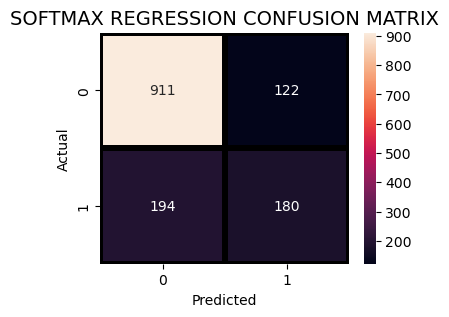

In [163]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, lr_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("SOFTMAX REGRESSION CONFUSION MATRIX",fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

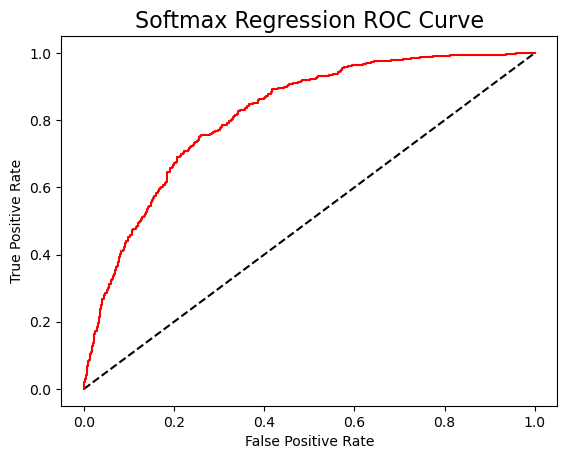

In [162]:
y_pred_prob = best_logistic_regression.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr, tpr, label='Logistic Regression',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Softmax Regression ROC Curve',fontsize=16)
plt.show();

### Trying Different Hyperparameter values

In [111]:
lr = LogisticRegression(multi_class='multinomial', C=0.1, solver='lbfgs', max_iter=100)

metrics = calculate_classification_metrics(lr, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8086770981507824
Validation Accuracy: 0.8052594171997157
Test Accuracy: 0.7775408670931059
Precision: 0.7689257427867736
Recall: 0.7775408670931059
F1 Score: 0.7720817158195403


In [144]:
lr = LogisticRegression(multi_class='multinomial', C=100, solver='newton-cg', max_iter=900)

metrics = calculate_classification_metrics(lr, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8082029397818872
Validation Accuracy: 0.8102345415778252
Test Accuracy: 0.775408670931059
Precision: 0.7680612388563527
Recall: 0.775408670931059
F1 Score: 0.7709655822049543


In [145]:
lr = LogisticRegression(multi_class='multinomial', C=0.01, solver='saga', max_iter=100)

metrics = calculate_classification_metrics(lr, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8096254148885728
Validation Accuracy: 0.8017057569296375
Test Accuracy: 0.775408670931059
Precision: 0.763720420232174
Recall: 0.775408670931059
F1 Score: 0.7672298921467914


In [143]:
lr = LogisticRegression(multi_class='multinomial', C=5, solver='saga', max_iter=1000)

metrics = calculate_classification_metrics(lr, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8084400189663348
Validation Accuracy: 0.8102345415778252
Test Accuracy: 0.7761194029850746
Precision: 0.7689604054150039
Recall: 0.7761194029850746
F1 Score: 0.7718060559252448


### Discussion on the impact of different hyperparameters for Logistic Regression:

After trying different hyperparameter values, I can infer the following observations:

* Increasing C does not lead the model to overfitting in this case and hence we can increase C to get more accurate results.
* On the other hand, upon decreasing C, the model underfits.
* Moreover, changing 'solver' in this particular case does not have much impact on the outcome w.r.t. accuracy. Likewise, for the maximum number of iterations.

### b: SVM

In [130]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_grid = {
    'C': [0.01, 0.1, 1.0, 5.0, 10.0],
    'kernel': ['rbf','poly' 'linear' 'sigmoid'],
    'degree': [2, 3, 4],
    'gamma': [0.01, 1.0, 10.0, 50.0]
}

svm = SVC(random_state=42)

random_search = RandomizedSearchCV(svm, param_distributions=param_grid, scoring='accuracy', random_state=42)

random_search.fit(X_train, y_train)

best_C_svm = random_search.best_params_['C']
best_kernel = random_search.best_params_['kernel']
best_degree = random_search.best_params_['degree']
best_gamma = random_search.best_params_['gamma']

print(random_search.best_estimator_)
print(random_search.best_params_)

print("----------------------")

best_svm = SVC(C=best_C_svm, kernel=best_kernel, degree=best_degree, gamma=best_gamma, probability=True)

metrics = calculate_classification_metrics(best_svm, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")


SVC(degree=4, gamma=0.01, random_state=42)
{'kernel': 'rbf', 'gamma': 0.01, 'degree': 4, 'C': 1.0}
----------------------
Train Accuracy: 0.8060692271218587
Validation Accuracy: 0.8031272210376688
Test Accuracy: 0.7839374555792467
Precision: 0.7696669668090003
Recall: 0.7839374555792467
F1 Score: 0.7713727609619144


In [61]:
svc_pred = best_svm.predict(X_test)
report = classification_report(y_test,svc_pred)
print(report)

              precision    recall  f1-score   support

           0       0.82      0.90      0.86      1033
           1       0.63      0.45      0.53       374

    accuracy                           0.78      1407
   macro avg       0.73      0.68      0.69      1407
weighted avg       0.77      0.78      0.77      1407



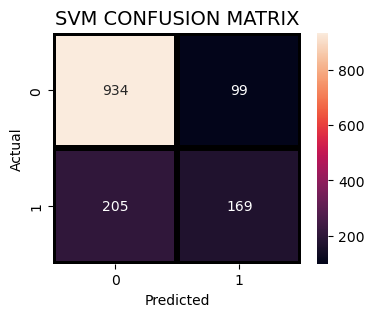

In [98]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, svc_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title("SVM CONFUSION MATRIX",fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

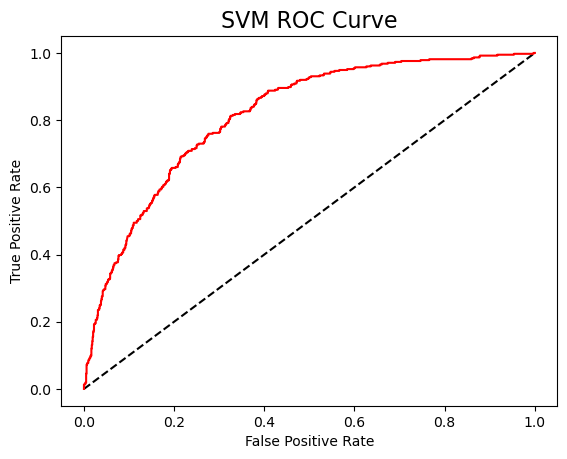

In [72]:
y_svmpred_prob = best_svm.predict_proba(X_test)[:,1]
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_svmpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_rf, tpr_rf, label='SVM',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVM ROC Curve',fontsize=16)
plt.show();

### Trying Different Hyperparameter values

In [146]:
svc = SVC(C=10.0, kernel='rbf', degree=2, gamma = 0.01)

metrics = calculate_classification_metrics(svc, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8074917022285444
Validation Accuracy: 0.8024164889836531
Test Accuracy: 0.7874911158493249
Precision: 0.7731959075112645
Recall: 0.7874911158493249
F1 Score: 0.7737899817707563


In [148]:
svc = SVC(C=10.0, kernel='rbf', degree=2, gamma = 10)

metrics = calculate_classification_metrics(svc, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.9732100521574206
Validation Accuracy: 0.759772565742715
Test Accuracy: 0.7526652452025586
Precision: 0.7231505680527344
Recall: 0.7526652452025586
F1 Score: 0.7089471221844713


In [156]:
svc = SVC(C=100, kernel='rbf', degree=2, gamma = 0.01)

metrics = calculate_classification_metrics(svc, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8212422949265055
Validation Accuracy: 0.8073916133617626
Test Accuracy: 0.7867803837953091
Precision: 0.773712236384252
Recall: 0.7867803837953091
F1 Score: 0.7758170646531011


In [157]:
svc = SVC(C=1.0, kernel='sigmoid', degree=2, gamma = 0.01)

metrics = calculate_classification_metrics(svc, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8058321479374111
Validation Accuracy: 0.8024164889836531
Test Accuracy: 0.7775408670931059
Precision: 0.7659102402115333
Recall: 0.7775408670931059
F1 Score: 0.7693076489219198


In [159]:
svc = SVC(C=20.0, kernel='poly', degree=2, gamma = 0.1)

metrics = calculate_classification_metrics(svc, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8176861071597914
Validation Accuracy: 0.8002842928216063
Test Accuracy: 0.7853589196872779
Precision: 0.7721057738823889
Recall: 0.7853589196872779
F1 Score: 0.7743225117507884


### Discussion on the impact of different hyperparameters for SVM:

After trying different hyperparameter values, I can infer the following observations:

* Using the 'rbf' kernel, decreasing gamma leads the model to underfit and increasing gamma leads the model to overfit.
* Decreasing C leads to underfitting and increasing C leads to overfitting.
* I also tried changing the kernel to 'poly' or 'sigmoid' and tried it with different degrees. I notice that there is no change upon changing the kernel type but a minor change upon changing the degree.

### c: Random Forest

In [160]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

param_grid = {
    'n_estimators': [100, 500, 1000, 2500],
    'max_depth': [5, 10, 20],
    'min_samples_split': [5, 10, 20, 50],
    'min_samples_leaf': [5, 10, 15]
}

random_forest = RandomForestClassifier(random_state=42)

random_search = RandomizedSearchCV(random_forest, param_distributions=param_grid, scoring='accuracy', random_state=42)

random_search.fit(X_train, y_train)

best_n_estimators = random_search.best_params_['n_estimators']
best_max_depth = random_search.best_params_['max_depth']
best_min_samples_split = random_search.best_params_['min_samples_split']
best_min_samples_leaf = random_search.best_params_['min_samples_leaf']

print(random_search.best_estimator_)
print(random_search.best_params_)

print("----------------------")

best_random_forest = RandomForestClassifier(n_estimators=best_n_estimators, 
                                            max_depth=best_max_depth, 
                                            min_samples_split=best_min_samples_split, 
                                            min_samples_leaf=best_min_samples_leaf)

best_random_forest.fit(X_train, y_train)

metrics = calculate_classification_metrics(best_random_forest, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

RandomForestClassifier(max_depth=10, min_samples_leaf=10, min_samples_split=5,
                       n_estimators=1000, random_state=42)
{'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 10, 'max_depth': 10}
----------------------
Train Accuracy: 0.8416311047889995
Validation Accuracy: 0.8059701492537313
Test Accuracy: 0.7924662402274343
Precision: 0.7802856360862691
Recall: 0.7924662402274343
F1 Score: 0.7820675154396455


In [161]:
rf_pred = best_random_forest.predict(X_test)
report = classification_report(y_test,rf_pred)
print(report)

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.65      0.48      0.55       374

    accuracy                           0.79      1407
   macro avg       0.74      0.69      0.71      1407
weighted avg       0.78      0.79      0.78      1407



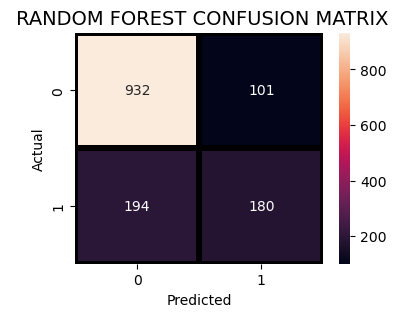

In [99]:
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, rf_pred),
                annot=True,fmt = "d",linecolor="k",linewidths=3)
    
plt.title(" RANDOM FOREST CONFUSION MATRIX",fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

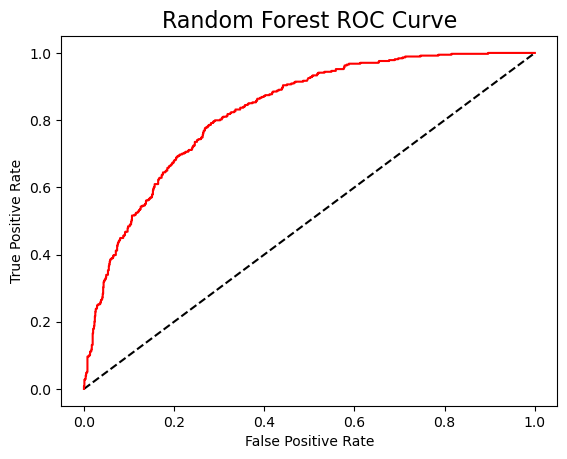

In [80]:
y_rfpred_prob = best_random_forest.predict_proba(X_test)[:,1]
fpr_rf, tpr_rf, thresholds = roc_curve(y_test, y_rfpred_prob)
plt.plot([0, 1], [0, 1], 'k--' )
plt.plot(fpr_rf, tpr_rf, label='Random Forest',color = "r")
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest ROC Curve',fontsize=16)
plt.show();

### Trying Different Hyperparameter values

In [121]:
rf = RandomForestClassifier(n_estimators=100, 
                            max_depth=20, 
                            min_samples_split=5, 
                            min_samples_leaf=1, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.958511142721669
Validation Accuracy: 0.7867803837953091
Test Accuracy: 0.7860696517412935
Precision: 0.7721943428336265
Recall: 0.7860696517412935
F1 Score: 0.7737759050769621


In [164]:
rf = RandomForestClassifier(n_estimators=100, 
                            max_depth=20, 
                            min_samples_split=5,
                            min_samples_leaf=50, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.813655761024182
Validation Accuracy: 0.8052594171997157
Test Accuracy: 0.7889125799573561
Precision: 0.774138319366982
Recall: 0.7889125799573561
F1 Score: 0.772142462448578


In [165]:
rf = RandomForestClassifier(n_estimators=5000, 
                            max_depth=10, 
                            min_samples_split=5,
                            min_samples_leaf=10, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.843764817449028
Validation Accuracy: 0.8059701492537313
Test Accuracy: 0.7889125799573561
Precision: 0.7765360798515948
Recall: 0.7889125799573561
F1 Score: 0.7787465942932443


In [166]:
rf = RandomForestClassifier(n_estimators=1000, 
                            max_depth=100, 
                            min_samples_split=5,
                            min_samples_leaf=5, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8710289236605027
Validation Accuracy: 0.8009950248756219
Test Accuracy: 0.7903340440653873
Precision: 0.7782978210684878
Recall: 0.7903340440653873
F1 Score: 0.7805055532996704


In [167]:
rf = RandomForestClassifier(n_estimators=1000, 
                            max_depth=5, 
                            min_samples_split=5, 
                            min_samples_leaf=5, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.810099573257468
Validation Accuracy: 0.8073916133617626
Test Accuracy: 0.7882018479033405
Precision: 0.7733388683359858
Recall: 0.7882018479033405
F1 Score: 0.7718689148822376


In [126]:
rf = RandomForestClassifier(n_estimators=100, 
                            max_depth=20, 
                            min_samples_split=5, 
                            min_samples_leaf=5, random_state = 42)

metrics = calculate_classification_metrics(rf, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.873162636320531
Validation Accuracy: 0.8017057569296375
Test Accuracy: 0.7931769722814499
Precision: 0.7813134656004767
Recall: 0.7931769722814499
F1 Score: 0.7832163600650979


### Discussion on the impact of different hyperparameters for Random Forest:

After trying different hyperparameter values, I can infer the following observations:

* I notice that upon increasing the maximum depth of the tree leads, the model is overfitting. However, upon decreasing it's value, the model does not underfit the data in this particular case.
* Upon increasing the minimum samples (split) leads to a lower bias and higher variance i.e. it generalizes the unseen data (i.e. test data) better.
* Decreasing the minimum samples (leaf) leads to drastic overfitting and increasing it leads to underfitting.
* I also observed that the higher the number of estimators, the better the overall accuracy of the model on validation and test data.

### Feature Importance

In [87]:
feature_imp_df = pd.DataFrame({
    "Feature Name": X_train.columns,
    "Importance": best_random_forest.feature_importances_
})

feature_imp = feature_imp_df.sort_values(by='Importance', ascending=False)
feature_imp

,Feature Name,Importance
14,Contract,0.184595
4,tenure,0.164130
18,TotalCharges,0.130614
17,MonthlyCharges,0.112971
8,OnlineSecurity,0.093616
11,TechSupport,0.076957
7,InternetService,0.049338
16,PaymentMethod,0.034338
9,OnlineBackup,0.032153
15,PaperlessBilling,0.027587


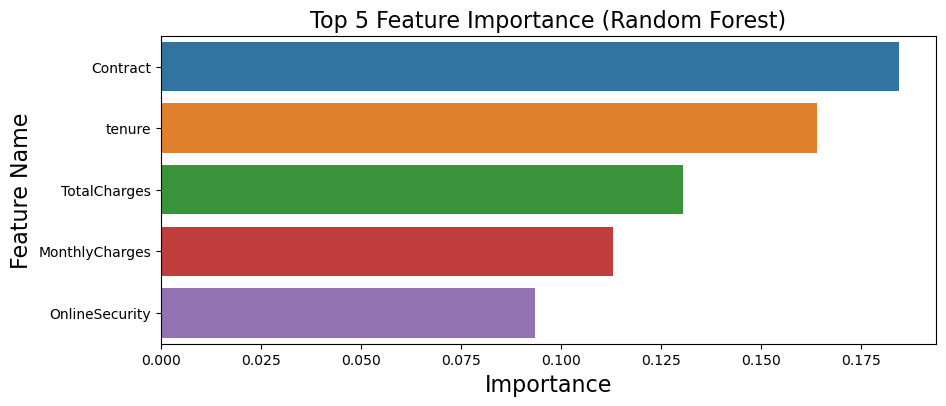

In [93]:
feature_imp2 = feature_imp.head()
plt.figure(figsize=(10,4))
sns.barplot(data=feature_imp2, x='Importance', y='Feature Name')
plt.title('Top 5 Feature Importance (Random Forest)', fontsize=16)
plt.xlabel('Importance', fontsize=16)
plt.ylabel('Feature Name', fontsize=16)
plt.show()

# Question 5

### Ensemble using Soft Voting

In [168]:
logistic_regression = LogisticRegression(multi_class='multinomial', 
                                         C=best_C, 
                                         solver=best_solver, 
                                         max_iter=best_max_iter)

svm_classifier = SVC(C=best_C_svm, 
                     kernel=best_kernel, 
                     degree=best_degree, 
                     gamma=best_gamma, probability=True)

random_forest = RandomForestClassifier(n_estimators=best_n_estimators, 
                                       max_depth=best_max_depth, 
                                       min_samples_split=best_min_samples_split, 
                                       min_samples_leaf=best_min_samples_leaf)

voting_classifier = VotingClassifier(estimators=[('lr', logistic_regression), 
                                                 ('svm', svm_classifier), 
                                                 ('rf', random_forest)], voting='soft')

voting_classifier.fit(X_train, y_train)

metrics = calculate_classification_metrics(voting_classifier, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8200568990042674
Validation Accuracy: 0.8116560056858564
Test Accuracy: 0.7874911158493249
Precision: 0.7747685210486877
Recall: 0.7874911158493249
F1 Score: 0.7769815702779996


In [74]:
ensemble_pred = voting_classifier.predict(X_test)
report = classification_report(y_test,ensemble_pred)
print(report)

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1033
           1       0.64      0.48      0.54       374

    accuracy                           0.79      1407
   macro avg       0.73      0.69      0.70      1407
weighted avg       0.78      0.79      0.78      1407



### Ensemble using Hard Voting

In [169]:
logistic_regression = LogisticRegression(multi_class='multinomial', 
                                         C=best_C, 
                                         solver=best_solver, 
                                         max_iter=best_max_iter)

svm_classifier = SVC(C=best_C_svm, 
                     kernel=best_kernel, 
                     degree=best_degree, 
                     gamma=best_gamma, probability=True)

random_forest = RandomForestClassifier(n_estimators=best_n_estimators, 
                                       max_depth=best_max_depth, 
                                       min_samples_split=best_min_samples_split, 
                                       min_samples_leaf=best_min_samples_leaf)

voting_classifier = VotingClassifier(estimators=[('lr', logistic_regression), 
                                                 ('svm', svm_classifier), 
                                                 ('rf', random_forest)], voting='hard')

voting_classifier.fit(X_train, y_train)

metrics = calculate_classification_metrics(voting_classifier, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.8167377904220009
Validation Accuracy: 0.8024164889836531
Test Accuracy: 0.783226723525231
Precision: 0.7699745602733177
Recall: 0.783226723525231
F1 Score: 0.7725062840628424


##### Extra: Trying other ensemble techniques:

###### Ensemble using Stacking

In [176]:
from sklearn.ensemble import StackingClassifier

base_estimators = [
    ('lr', logistic_regression),
    ('svm', svm_classifier),
    ('rf', random_forest)
]

meta_model = LogisticRegression(multi_class='multinomial', C=best_C, solver=best_solver, max_iter=best_max_iter, random_state=42)

stacking_classifier = StackingClassifier(estimators=base_estimators, final_estimator=meta_model)

stacking_classifier.fit(X_train, y_train)

metrics = calculate_classification_metrics(stacking_classifier, X_train, y_train, X_val, y_val, X_test, y_test)

for metric, value in metrics.items():
    print(f"{metric}: {value}")

Train Accuracy: 0.810099573257468
Validation Accuracy: 0.7981520966595593
Test Accuracy: 0.7860696517412935
Precision: 0.7708820250841891
Recall: 0.7860696517412935
F1 Score: 0.7629365776742741


We get a lower accuracy compared to that of Soft Voting ensemble technique.

###### Ensemble using Bagging

In [178]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

base_estimators = [
    LogisticRegression(multi_class='multinomial', C=best_C, solver=best_solver, max_iter=best_max_iter, random_state=42),
    SVC(C=best_C_svm, kernel=best_kernel, degree=best_degree, gamma=best_gamma, probability=True, random_state=42),
    RandomForestClassifier(n_estimators=best_n_estimators, 
                           max_depth=best_max_depth, 
                           min_samples_split=best_min_samples_split, 
                           min_samples_leaf=best_min_samples_leaf, random_state=42)
]

bagging_classifiers = []

for estimator in base_estimators:
    bagging_classifier = BaggingClassifier(base_estimator=estimator, n_estimators=10, random_state=42)
    bagging_classifiers.append(bagging_classifier)

for i, bagging_classifier in enumerate(bagging_classifiers):
    bagging_classifier.fit(X_train, y_train)
    metrics = calculate_classification_metrics(bagging_classifier, X_train, y_train, X_val, y_val, X_test, y_test)
    print(f"Metrics for Base Estimator {base_estimators[i]}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print("\n")

Metrics for Base Estimator LogisticRegression(C=0.01, max_iter=500, multi_class='multinomial',
                   random_state=42, solver='saga'):
Train Accuracy: 0.8070175438596491
Validation Accuracy: 0.8024164889836531
Test Accuracy: 0.7782515991471215
Precision: 0.76706442412848
Recall: 0.7782515991471215
F1 Score: 0.7704379281167707


Metrics for Base Estimator SVC(degree=4, gamma=0.01, probability=True, random_state=42):
Train Accuracy: 0.8074917022285444
Validation Accuracy: 0.806680881307747
Test Accuracy: 0.7796730632551528
Precision: 0.7649324540620042
Recall: 0.7796730632551528
F1 Score: 0.7671624133105547


Metrics for Base Estimator RandomForestClassifier(max_depth=10, min_samples_leaf=10, min_samples_split=5,
                       n_estimators=1000, random_state=42):
Train Accuracy: 0.8321479374110953
Validation Accuracy: 0.8095238095238095
Test Accuracy: 0.7903340440653873
Precision: 0.7773620993237198
Recall: 0.7903340440653873
F1 Score: 0.7788551593919266




We get a lower accuracy compared to that of Soft Voting ensemble technique.

### Discussion on Findings:

I can conclude the following observations/findings from the results:
* Upon looking at the classifier metrics of the ensemble model and the 3 classifiers, the ensemble model (using soft voting) outperfoms all the other 3 classifiers in terms of validation and test set accuracy which means ensemble model of the 3 classifiers is the best choice for this particular dataset.
* Soft voting performs better than hard voting because it takes into account the confidence or probability estimates of each classifier, rather than just the final predicted class labels. This can lead to more accurate and robust ensemble predictions.
* Random Forest outperforms the Logistic Regression and SVM Classifier models individually. One of the reason is that Random Forests can capture complex non-linear relationships in the data due to their ability to create decision boundaries based on splits in the feature space. If the underlying patterns in the data are non-linear, Random Forest can capture them effectively, whereas Logistic Regression assumes linear relationships and kernel SVM uses non-linear transformations which might not capture the complexity as well.
* Another reason I can think of is that Random Forests are less prone to overfitting, especially when compared to complex models like kernel SVM, which can be sensitive to the choice of the kernel and its parameters. Logistic Regression, while generally robust, can also overfit if the feature space is highly dimensional and the number of samples is limited.
* In summary, it is necessary to choose the most appropriate and perfect hyperparameters for the model else it may lead to drastic underfitting or overfitting of the data.